# 1. Environment Setup & Warning Suppression

In [1]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


#  2. Library Imports & Tools Initialization

In [2]:

import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix



# 3. Deep Learning Framework Setup & Mixed Precision Configuration

In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

print(tf.__version__)


2025-06-13 08:47:11.076673: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749804431.306840      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749804431.379007      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2.18.0


# 4. Data Loading & Exploration
## 4.1 Dataset Paths Definition

In [4]:
dataset = {
             "train_data" : "/kaggle/input/indian-birds/Birds_25/train",
             "valid_data" : "/kaggle/input/indian-birds/Birds_25/valid",
          }

## 4.2 Extracting Image Paths & Labels into DataFrames

In [5]:


all_data = []
for path in dataset.values():
    data = {"imgpath": [] , "labels": [] }
    category = os.listdir(path)

    for folder in category:
        folderpath = os.path.join(path , folder)
        filelist = os.listdir(folderpath)
        for file in filelist:
            fpath = os.path.join(folderpath, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)
        
        
    all_data.append(data.copy())
    data.clear()

    
    
train_df = pd.DataFrame(all_data[0] , index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1] , index=range(len(all_data[1]['imgpath'])))



## 4.3 Label Encoding for Model Compatibility

In [6]:


lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.fit_transform(valid_df['labels'])

## 4.4 Creating a Test Set from Validation Data

In [7]:
valid_df , test_df = train_test_split(valid_df ,  train_size= 0.95 , shuffle=True, random_state=124)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

##  4.5 Visualizing Class Distribution in Training Data

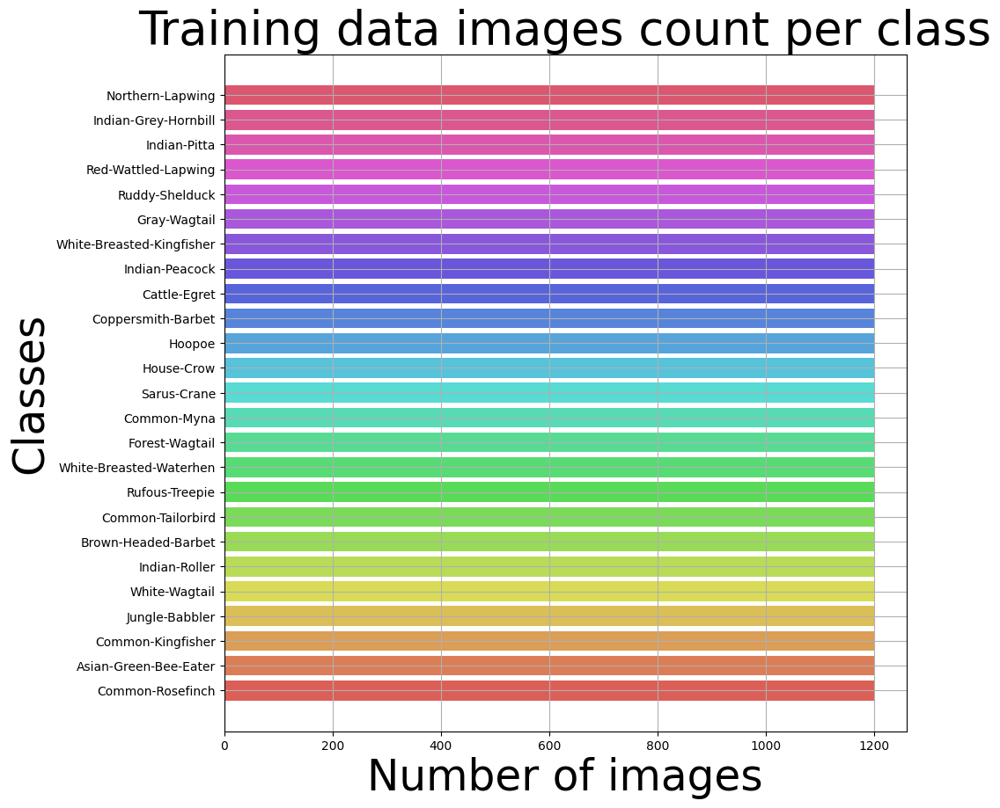

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

train = train_df["labels"].value_counts()
label = train.tolist()
index = train.index.tolist()


num_classes = len(index)
colors = sns.color_palette("hls", num_classes)  # hls = Hue-Lightness-Saturation 

plt.figure(figsize=(10, 10))
plt.title("Training data images count per class", fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)
plt.barh(index, label, color=colors)
plt.grid(True)
plt.show()


##  4.6 Sampling & Inspecting Training Data

In [9]:
train_df.sample(n=15, random_state=1)

,imgpath,labels,encoded_labels
10747,/kaggle/input/indian-birds/Birds_25/train/Rufo...,Rufous-Treepie,20
12573,/kaggle/input/indian-birds/Birds_25/train/Fore...,Forest-Wagtail,8
29676,/kaggle/input/indian-birds/Birds_25/train/Nort...,Northern-Lapwing,17
8856,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common-Tailorbird,6
21098,/kaggle/input/indian-birds/Birds_25/train/Indi...,Indian-Peacock,13
17458,/kaggle/input/indian-birds/Birds_25/train/Hoop...,Hoopoe,10
1476,/kaggle/input/indian-birds/Birds_25/train/Asia...,Asian-Green-Bee-Eater,0
5120,/kaggle/input/indian-birds/Birds_25/train/Whit...,White-Wagtail,24
18338,/kaggle/input/indian-birds/Birds_25/train/Copp...,Coppersmith-Barbet,7
28279,/kaggle/input/indian-birds/Birds_25/train/Indi...,Indian-Grey-Hornbill,12


## 4.7 Data Summary: Sample Records & Dataset Shapes

In [10]:
print("----------Train-------------")
print(train_df[["imgpath", "labels"]].head(5))
print(train_df.shape)
print("--------Validation----------")
print(valid_df[["imgpath", "labels"]].head(5))
print(valid_df.shape)
print("----------Test--------------")
print(test_df[["imgpath", "labels"]].head(5))
print(test_df.shape)

----------Train-------------
                                             imgpath            labels
0  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
1  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
2  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
3  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
4  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
(30000, 3)
--------Validation----------
                                             imgpath               labels
0  /kaggle/input/indian-birds/Birds_25/valid/Hous...           House-Crow
1  /kaggle/input/indian-birds/Birds_25/valid/Fore...       Forest-Wagtail
2  /kaggle/input/indian-birds/Birds_25/valid/Brow...  Brown-Headed-Barbet
3  /kaggle/input/indian-birds/Birds_25/valid/Red-...  Red-Wattled-Lapwing
4  /kaggle/input/indian-birds/Birds_25/valid/Gray...         Gray-Wagtail
(7125, 3)
----------Test--------------
                      

## 4.8 Image Preview from Validation Set

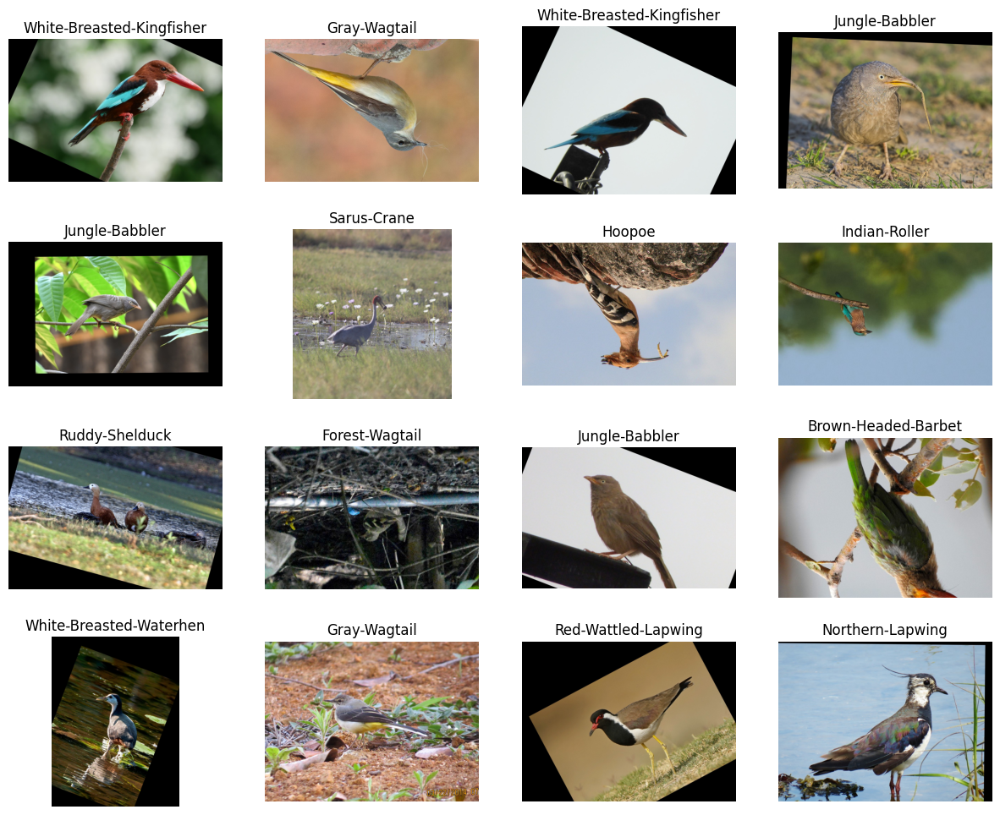

In [11]:
plt.figure(figsize=(15,12))
for i, row in valid_df.sample(n=16).reset_index().iterrows():
    plt.subplot(4,4,i+1)
    image_path = row['imgpath']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(row["labels"])
    plt.axis('off')
plt.show()

# 5. Data Preprocessing & Augmentation
## 5.1 Image Resizing, Preprocessing & Data Generator Setup

In [12]:
%%time

BATCH_SIZE = 50
IMAGE_SIZE = (224, 224)


generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
    
)


train_images = generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
)

val_images = generator.flow_from_dataframe(
    dataframe=valid_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_images = generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 30000 validated image filenames belonging to 25 classes.
Found 7125 validated image filenames belonging to 25 classes.
Found 375 validated image filenames belonging to 25 classes.
CPU times: user 469 ms, sys: 1.12 s, total: 1.59 s
Wall time: 1min 37s


#  6. Model Building
## 6.1 Load & Freeze Pretrained EfficientNetB3

In [13]:

pretrained_model = tf.keras.applications.EfficientNetB3(
    input_shape=(224, 224, 3),
    include_top=False, 
    weights='imagenet',
    pooling='max'
)


for i, layer in enumerate(pretrained_model.layers):
    pretrained_model.layers[i].trainable = False

I0000 00:00:1749804547.815748      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1749804547.816470      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


##  6.2 Add Augmentation & Compile the Final Model

In [14]:
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast

num_classes = len(set(train_images.classes))



augment = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1),
    RandomZoom(0.1),
    RandomContrast(0.1),
], name='AugmentationLayer')



inputs = layers.Input(shape = (224,224,3), name='inputLayer')
x = augment(inputs)
pretrain_out = pretrained_model(x, training = False)
x = layers.Dense(256)(pretrain_out)
x = layers.Activation(activation="relu")(x) 
x = BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes)(x)
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x) 
model = Model(inputs=inputs, outputs=outputs)



model.compile(
    optimizer=Adam(0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         393,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 25)                  │           6,425 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_2 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,184,456 (42.67 MB)

 Trainable params: 400,409 (1.53 MB)

 Non-trainable params: 10,784,047 (41.14 MB)

None


# 7. Model Training & Evaluation
##  7.1 Train the Model with Callbacks

In [15]:
    history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, mode='min')
    ]
)


#model.save_weights('./checkpoints/my_checkpoint.weights.h5')

Epoch 1/10


I0000 00:00:1749804586.748764      65 cuda_dnn.cc:529] Loaded cuDNN version 90300


600/600 ━━━━━━━━━━━━━━━━━━━━ 515s 799ms/step - accuracy: 0.6696 - loss: 1.2080 - val_accuracy: 0.8943 - val_loss: 0.3388 - learning_rate: 5.0000e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 270s 445ms/step - accuracy: 0.8642 - loss: 0.4564 - val_accuracy: 0.9241 - val_loss: 0.2504 - learning_rate: 5.0000e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 265s 438ms/step - accuracy: 0.8820 - loss: 0.3792 - val_accuracy: 0.9286 - val_loss: 0.2315 - learning_rate: 5.0000e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 264s 436ms/step - accuracy: 0.8930 - loss: 0.3587 - val_accuracy: 0.9302 - val_loss: 0.2244 - learning_rate: 5.0000e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 267s 440ms/step - accuracy: 0.9021 - loss: 0.3201 - val_accuracy: 0.9321 - val_loss: 0.2161 - learning_rate: 5.0000e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 267s 441ms/step - accuracy: 0.8999 - loss: 0.3291 - val_accuracy: 0.9319 - val_loss: 0.2162 - learning_rate: 5.0000e-04
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 274s 452ms/

##  7.2 Save Model Weights to Checkpoint

In [16]:
import os


checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)


model.save_weights(os.path.join(checkpoint_dir, 'my_checkpoint.weights.h5'))


##  7.3 Evaluate on Test Dataset

In [17]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.23112
Test Accuracy: 93.60%


## 7.4 Training History Visualization

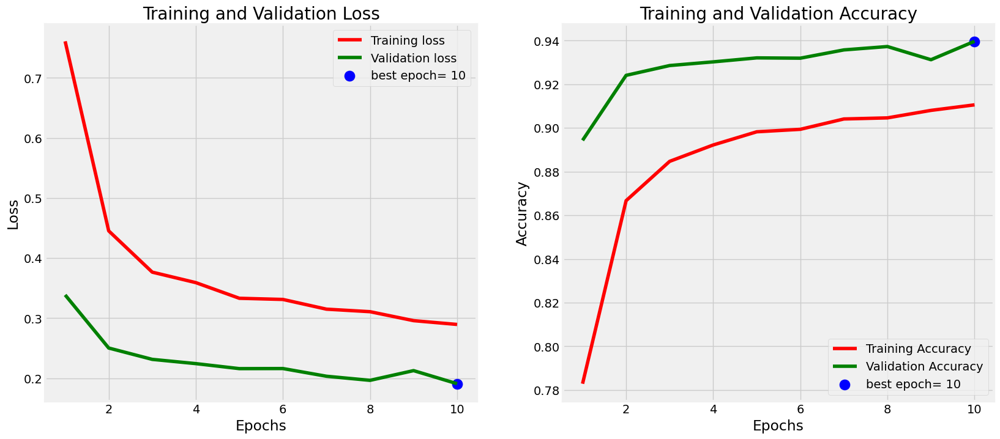

In [18]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

# 8. Model Performance Analysis
## 8.1 Classification Report & F1 Score

In [19]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
F1 Score: 0.9337574263341881
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.80      1.00      0.89        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       0.90      0.95      0.92        19
        Common-Kingfisher       1.00      0.90      0.95        21
              Common-Myna       1.00      0.87      0.93        15
         Common-Rosefinch       0.87      0.87      0.87        15
        Common-Tailorbird       0.95      0.78      0.86        23
       Coppersmith-Barbet       1.00      0.81      0.90        16
           Forest-Wagtail       0.94      1.00      0.97        17
             Gray-Wagtail       0.90      0.90      0.90        10
                   Hoopoe       1.00      0.92      0.96        12
               House-Crow       0.95      1.00      0.97        18
     Indian-Grey-Hornbill       1.00      0.93      0.96      

##  8.2 Prediction Results Compilation

In [20]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.995533
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,0.999637
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.997457
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,0.985304
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.999959
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,0.929056
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,0.998522
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.999603


##  8.3 Visualization of Misclassified Images

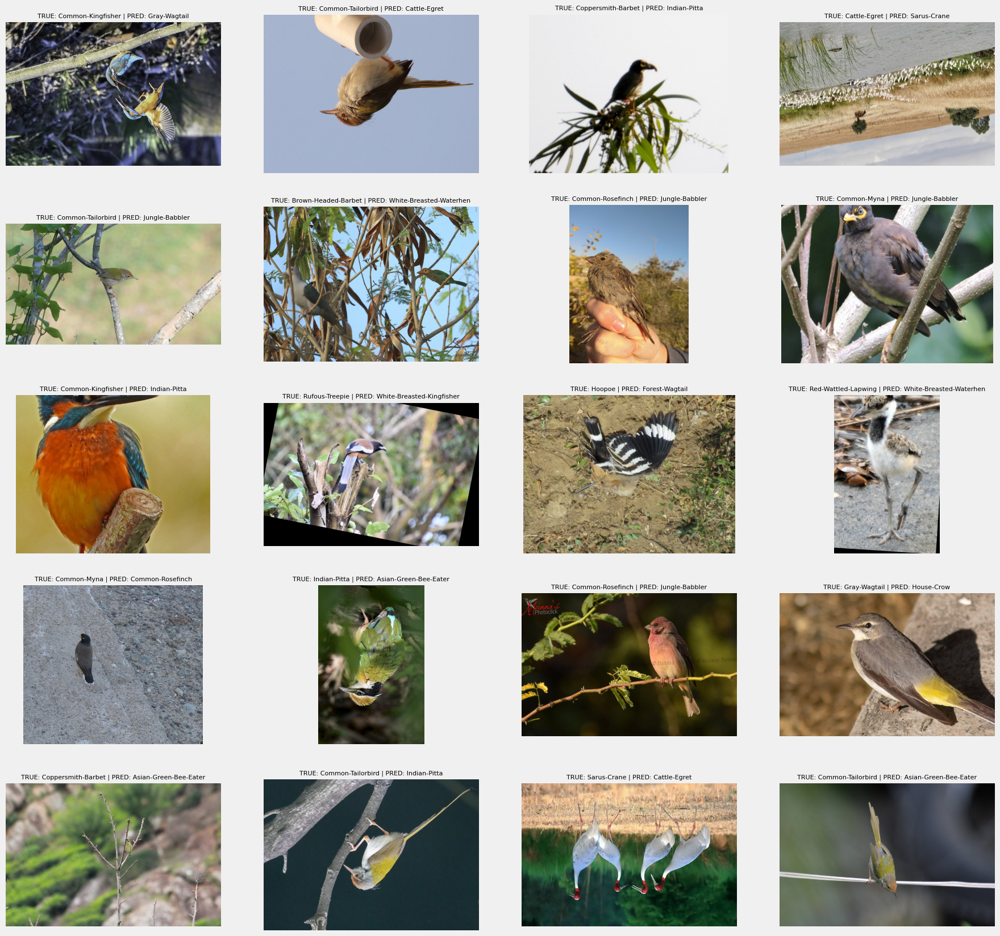

In [21]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

##  8.4 Confusion Matrix Visualization

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 289ms/step


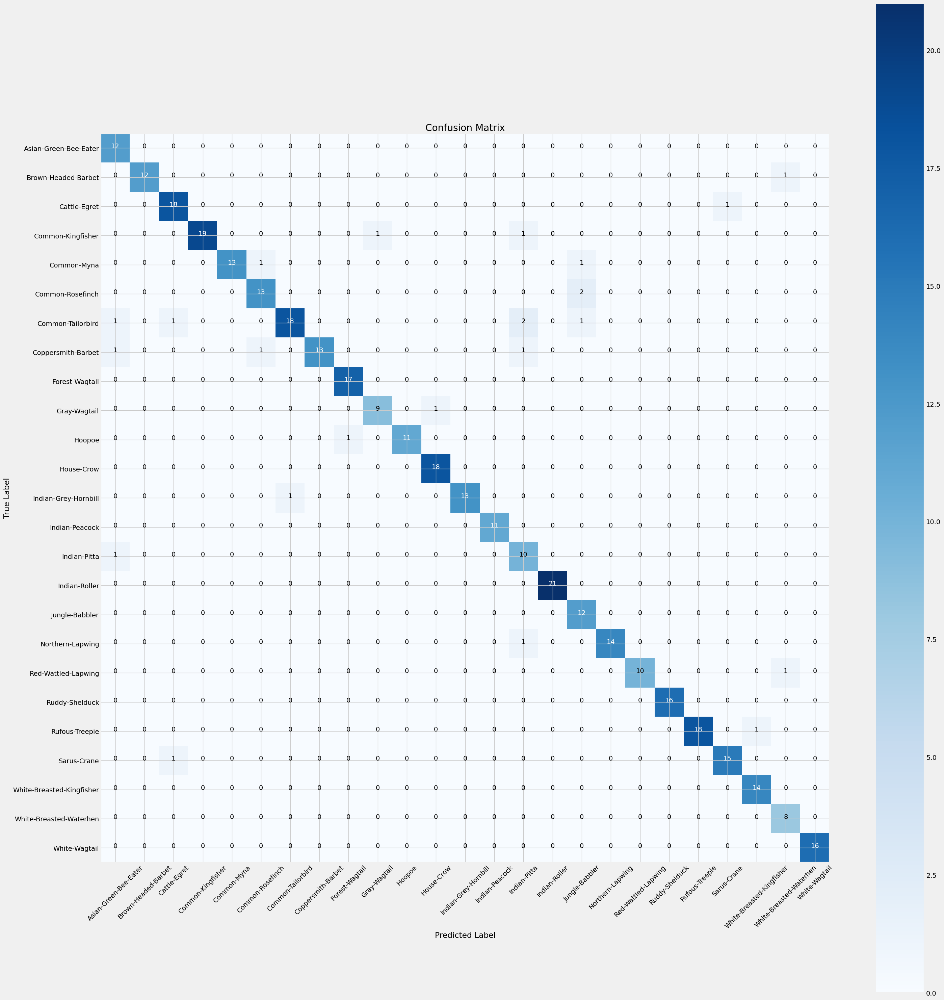

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 9. Model Fine-tuning & Training
## 9.1 Fine-tuning Pretrained Model Layers then Re-compiling & Training with Lower Learning Rate

In [23]:
pretrained_model.trainable = True
for layer in pretrained_model.layers:
    if isinstance(layer, layers.BatchNormalization): 
        layer.trainable = False
        

for l in pretrained_model.layers[:10]:
    print(l.name, l.trainable)

model.compile(
    optimizer=Adam(0.00001), 
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)


#model.save_weights('./checkpoints/my_checkpoint')

input_layer False
rescaling False
normalization False
rescaling_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         393,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 25)                  │           6,425 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_2 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,184,456 (42.67 MB)

 Trainable params: 400,409 (1.53 MB)

 Non-trainable params: 10,784,047 (41.14 MB)

None
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 311s 465ms/step - accuracy: 0.9144 - loss: 0.2788 - val_accuracy: 0.9481 - val_loss: 0.1695 - learning_rate: 1.0000e-05
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 351s 581ms/step - accuracy: 0.9196 - loss: 0.2613 - val_accuracy: 0.9481 - val_loss: 0.1673 - learning_rate: 1.0000e-05
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 267s 441ms/step - accuracy: 0.9218 - loss: 0.2562 - val_accuracy: 0.9499 - val_loss: 0.1648 - learning_rate: 1.0000e-05
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 257s 423ms/step - accuracy: 0.9186 - loss: 0.2663 - val_accuracy: 0.9503 - val_loss: 0.1635 - learning_rate: 1.0000e-05
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 265s 437ms/step - accuracy: 0.9159 - loss: 0.2632 - val_accuracy: 0.9500 - val_loss: 0.1625 - learning_rate: 1.0000e-05
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 276s 456ms/step - accuracy: 0.9192 - loss: 0.2609 - val_accuracy: 0.9499 - val_loss: 0.1612 - learning_rate: 1.0000e-05
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━

## 9.2 Save Model Weights to Checkpoint

In [24]:
import os


checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)


model.save_weights(os.path.join(checkpoint_dir, 'my_checkpoint.weights.h5'))


## 9.3 Evaluate on Test Dataset

In [25]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.17119
Test Accuracy: 95.20%


## 9.4 Training History Visualization

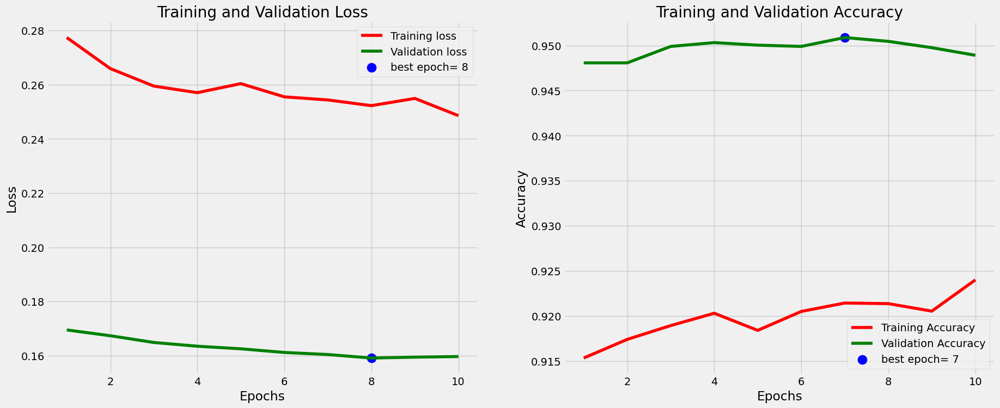

In [26]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

# 10. Model Performance Analysis
## 10.1 Classification Report & F1 Score

In [27]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
F1 Score: 0.9510078740772876
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.80      1.00      0.89        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       0.95      0.95      0.95        19
        Common-Kingfisher       1.00      0.95      0.98        21
              Common-Myna       0.93      0.93      0.93        15
         Common-Rosefinch       0.88      1.00      0.94        15
        Common-Tailorbird       0.95      0.87      0.91        23
       Coppersmith-Barbet       1.00      0.81      0.90        16
           Forest-Wagtail       0.94      1.00      0.97        17
             Gray-Wagtail       0.90      0.90      0.90        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       0.90      1.00      0.95        18
     Indian-Grey-Hornbill       0.93      0.93      0.93      

## 10.2 Prediction Results Compilation

In [28]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 293ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.988283
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,0.999650
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.995729
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,0.994241
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.999868
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,0.942428
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,0.997508
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.990054


## 10.3 Visualization of Misclassified Images

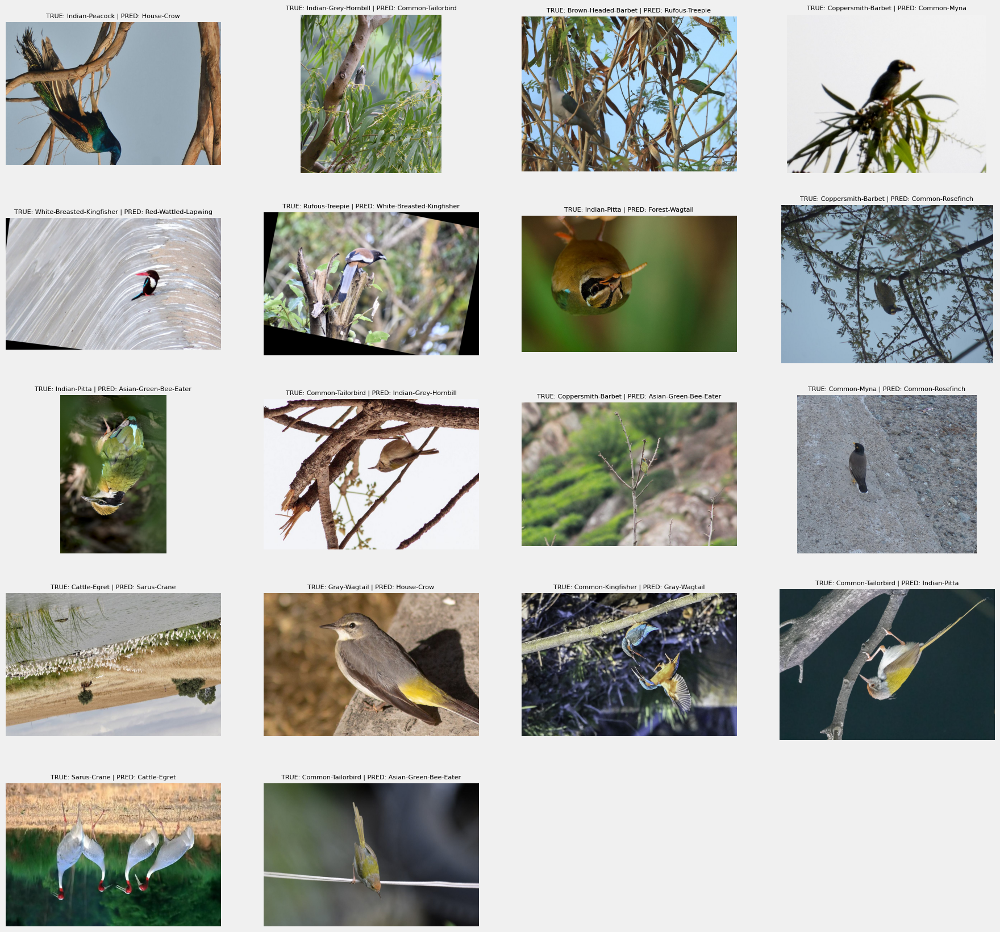

In [29]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

##  10.4 Confusion Matrix Visualization 

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 284ms/step


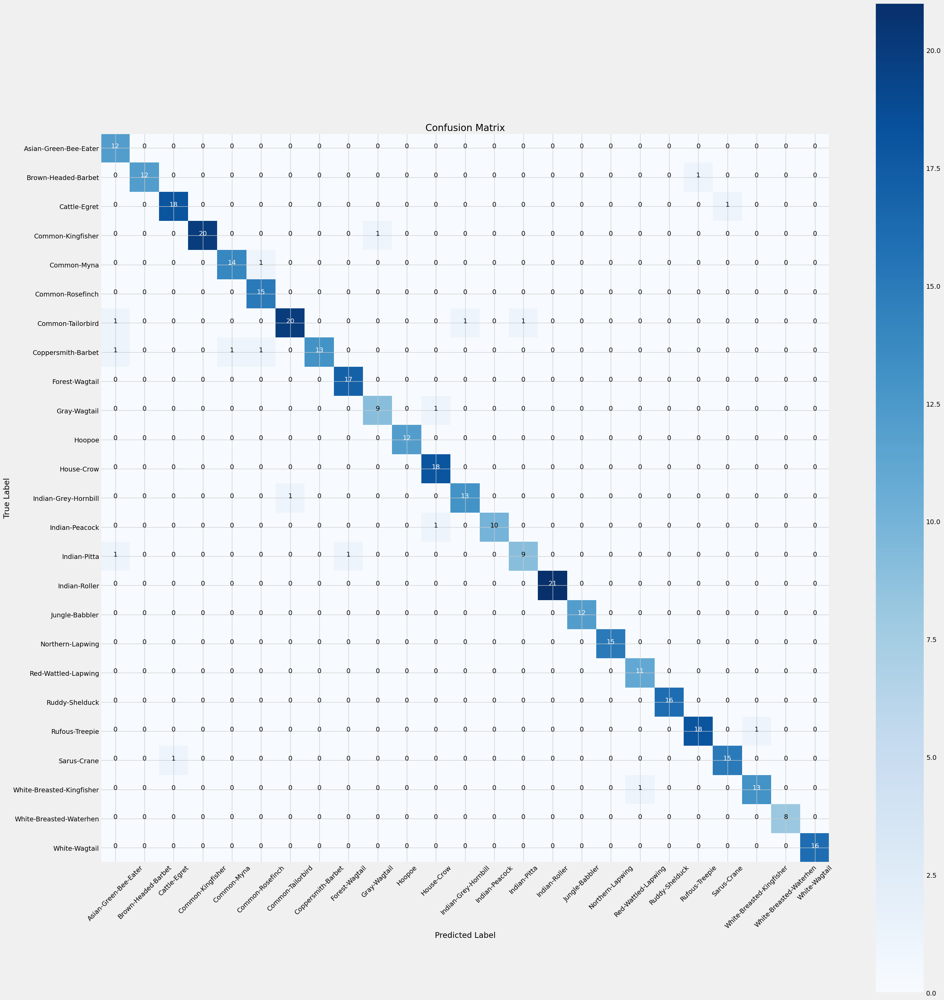

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 11.Custom Model Building with EfficientNetB3
## 11.1 Advanced Data Augmentation Layer with Model Architecture and Initial Training (Frozen Base)

In [31]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


pretrained_model = EfficientNetB3(include_top=False, input_shape=(224, 224, 3), pooling='avg')


num_classes = len(set(train_images.classes))


augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
], name='AugmentationLayer')


inputs = layers.Input(shape=(224, 224, 3), name='inputLayer')


x = augment(inputs)


x = layers.Rescaling(1./255)(x)


x = pretrained_model(x, training=False)


x = layers.Dense(512)(x)
x = layers.LeakyReLU()(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)

x = layers.Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)

x = layers.Dense(128, activation='relu')(x)


x = layers.Dense(num_classes)(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name='activationLayer')(x)


model = Model(inputs=inputs, outputs=outputs)


model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()


history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)


# model.save_weights('./checkpoints/efficientnetb3_custom_checkpoint.h5')


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_4 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_4 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         786,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 25)                  │           3,225 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_5 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,739,976 (44.78 MB)

 Trainable params: 11,651,649 (44.45 MB)

 Non-trainable params: 88,327 (345.03 KB)

Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 632s 868ms/step - accuracy: 0.6460 - loss: 1.2910 - val_accuracy: 0.5971 - val_loss: 1.5418 - learning_rate: 5.0000e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 519s 860ms/step - accuracy: 0.9381 - loss: 0.2183 - val_accuracy: 0.9484 - val_loss: 0.1774 - learning_rate: 5.0000e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 518s 859ms/step - accuracy: 0.9493 - loss: 0.1717 - val_accuracy: 0.9559 - val_loss: 0.1487 - learning_rate: 5.0000e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 518s 859ms/step - accuracy: 0.9583 - loss: 0.1516 - val_accuracy: 0.9634 - val_loss: 0.1328 - learning_rate: 5.0000e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 518s 859ms/step - accuracy: 0.9662 - loss: 0.1217 - val_accuracy: 0.9680 - val_loss: 0.1113 - learning_rate: 5.0000e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 518s 859ms/step - accuracy: 0.9681 - loss: 0.1095 - val_accuracy: 0.9611 - val_loss: 0.1450 - learning_rate: 5.0000e-04
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 

## 11.2 Evaluate on Test Dataset

In [32]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.02896
Test Accuracy: 99.47%


## 11.3 Training History Visualization

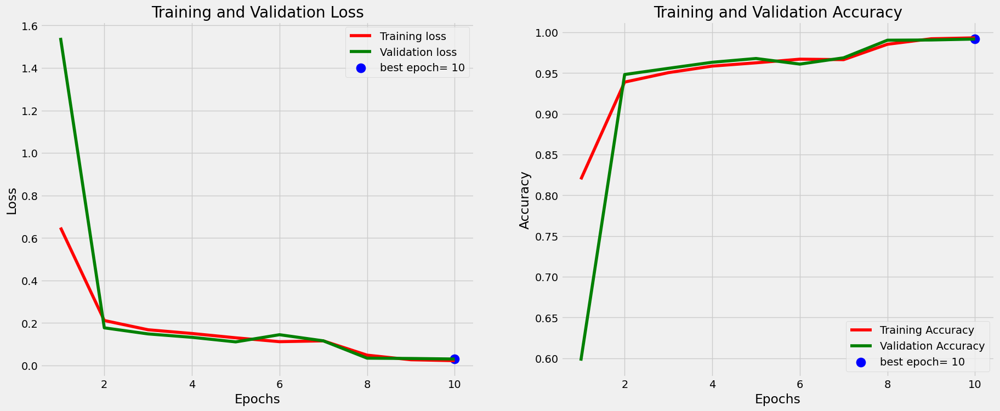

In [33]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

## 11.3 Classification Report & F1 Score

In [34]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step
F1 Score: 0.9948585274930102
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       1.00      1.00      1.00        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       1.00      0.95      0.97        19
        Common-Kingfisher       1.00      1.00      1.00        21
              Common-Myna       1.00      1.00      1.00        15
         Common-Rosefinch       1.00      1.00      1.00        15
        Common-Tailorbird       1.00      1.00      1.00        23
       Coppersmith-Barbet       1.00      1.00      1.00        16
           Forest-Wagtail       1.00      1.00      1.00        17
             Gray-Wagtail       1.00      1.00      1.00        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       0.95      1.00      0.97        18
     Indian-Grey-Hornbill       0.93      1.00      0.97      

## 11.4 Prediction Results Compilation

In [35]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 288ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.999759
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,0.999999
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.999898
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,1.000000
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,1.000000
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,0.978668
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,1.000000
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.000000


## 11.5 Visualization of Misclassified Images

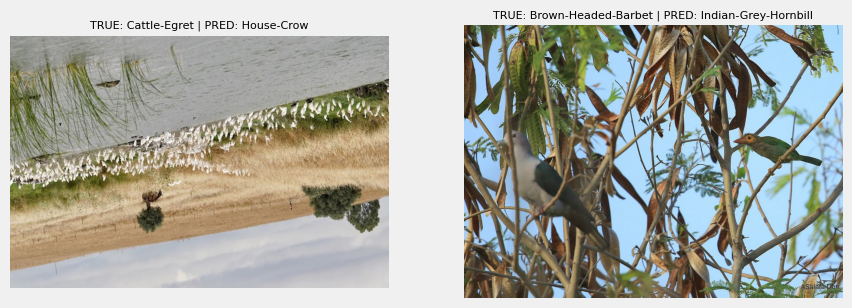

In [36]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

## 11.6 Confusion Matrix Visualization

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 280ms/step


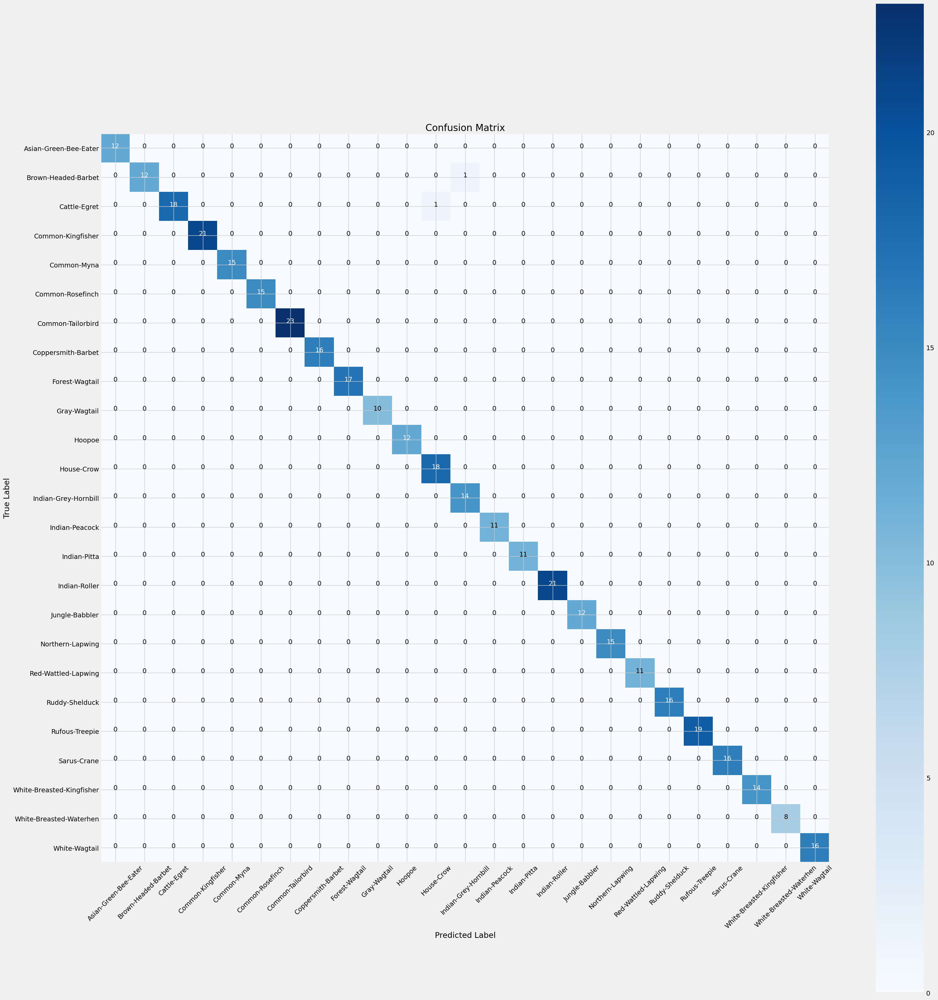

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 12. Transfer Learning with ResNet152V2
## 12.1 Model Initialization (Pretrained + Frozen) with Custom Classification Head and Unfreezing Base Model & Recompilation and Fine-Tuning

In [38]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


base_model = ResNet152V2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
base_model.trainable = False  


data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomZoom(0.1),
    layers.RandomTranslation(0.1, 0.1),
    layers.RandomContrast(0.2),
], name="data_augmentation")


inputs = layers.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)


x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, x)


model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2)
    ]
)


base_model.trainable = True
for layer in base_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


history_finetune = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2)
    ]
)


234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 326s 481ms/step - accuracy: 0.3970 - loss: 2.1863 - val_accuracy: 0.8262 - val_loss: 0.5687 - learning_rate: 1.0000e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 281s 464ms/step - accuracy: 0.7389 - loss: 0.8501 - val_accuracy: 0.8568 - val_loss: 0.4604 - learning_rate: 1.0000e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 279s 461ms/step - accuracy: 0.7895 - loss: 0.6822 - val_accuracy: 0.8728 - val_loss: 0.4086 - learning_rate: 1.0000e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 280s 462ms/step - accuracy: 0.8140 - loss: 0.6010 - val_accuracy: 0.8842 - val_loss: 0.3705 - learning_rate: 1.0000e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 275s 455ms/step - accuracy: 0.8243 - loss: 0.5548 - val_accuracy: 0.8883 - val_loss: 0.3550 - learning_rate: 1.0000e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 278s 459ms/step - accuracy: 0.8448 - loss: 0.4925 - val_accuracy: 0.8931 - val_loss: 0.3396 - learning_rate

## 12.2 Evaluate on Test Dataset

In [39]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0])) 
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.04991
Test Accuracy: 98.93%


## 12.4 Classification Report & F1 Score

In [40]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
F1 Score: 0.9890988103752512
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       1.00      1.00      1.00        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       1.00      0.95      0.97        19
        Common-Kingfisher       1.00      1.00      1.00        21
              Common-Myna       1.00      1.00      1.00        15
         Common-Rosefinch       1.00      1.00      1.00        15
        Common-Tailorbird       1.00      1.00      1.00        23
       Coppersmith-Barbet       1.00      1.00      1.00        16
           Forest-Wagtail       1.00      1.00      1.00        17
             Gray-Wagtail       1.00      1.00      1.00        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       1.00      1.00      1.00        18
     Indian-Grey-Hornbill       0.93      0.93      0.93      

## 12.3 Training History Visualization

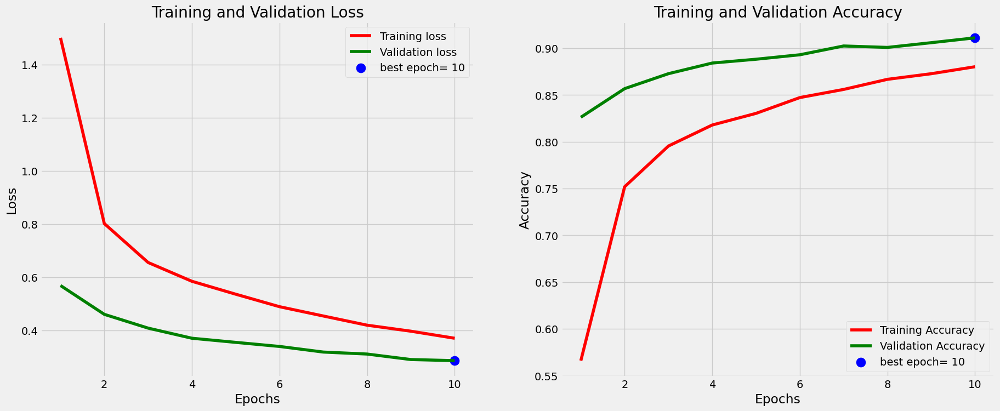

In [41]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

## 12.5 Prediction Results Compilation

In [42]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.0
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,1.0
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,1.0
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,1.0
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,1.0
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,1.0
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,1.0
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.0


# 12.6 Visualization of Misclassified Images

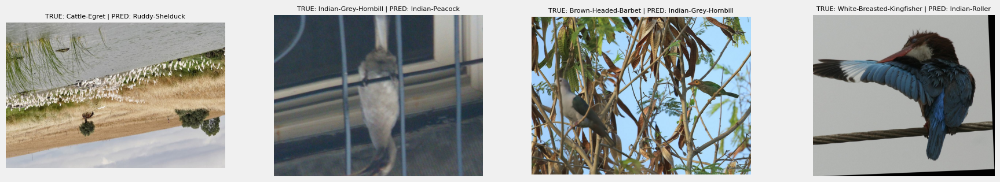

In [43]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

## 12.7 Confusion Matrix Visualization

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 278ms/step


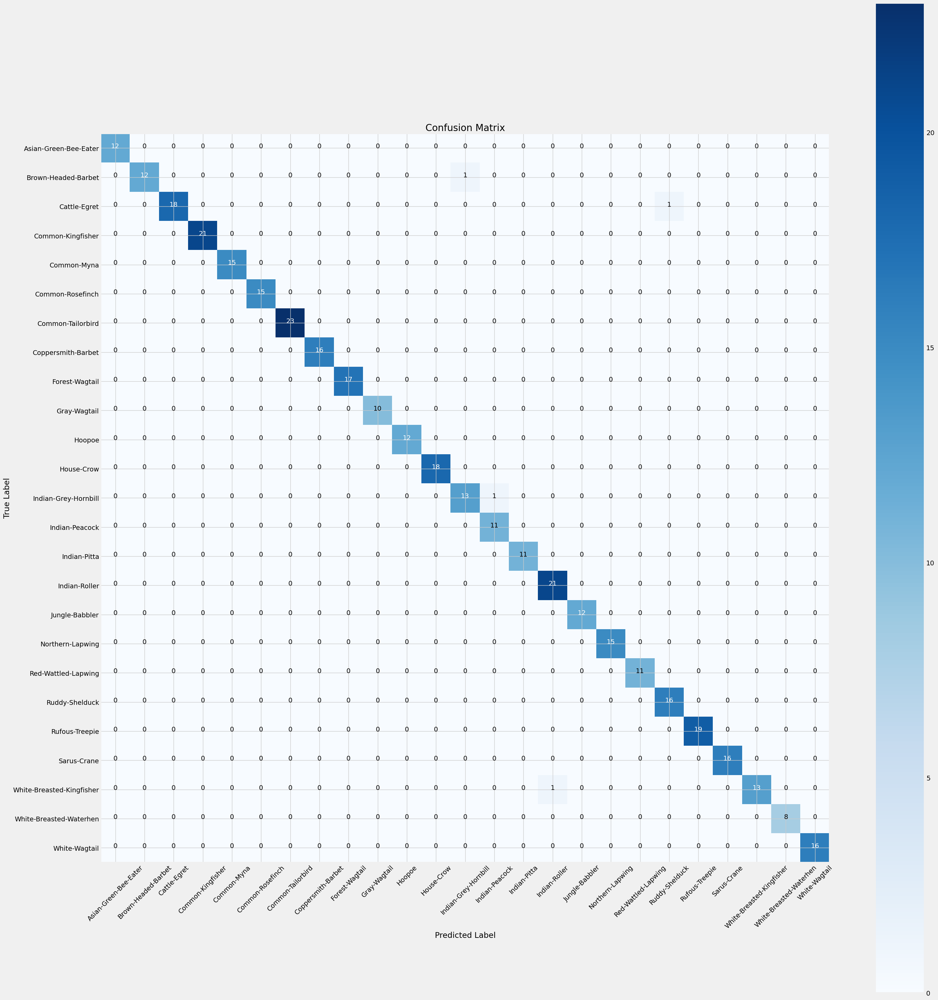

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 13. Training and Validation Curve Visualization for ResNet152V2 Model

In [45]:
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history, model_name):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])
    epochs = range(len(loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f'Training Curves for {model_name}', fontsize=16)

 
    ax1.plot(epochs, loss, label='Training Loss', marker='o')
    ax1.plot(epochs, val_loss, label='Validation Loss', marker='o')
    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)
    ax1.set_title('Loss (Lower is Better)', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.legend()


    ax2.plot(epochs, accuracy, label='Training Accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o')
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)
    ax2.set_title('Accuracy (Higher is Better)', fontsize=14)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.legend()

    plt.show()


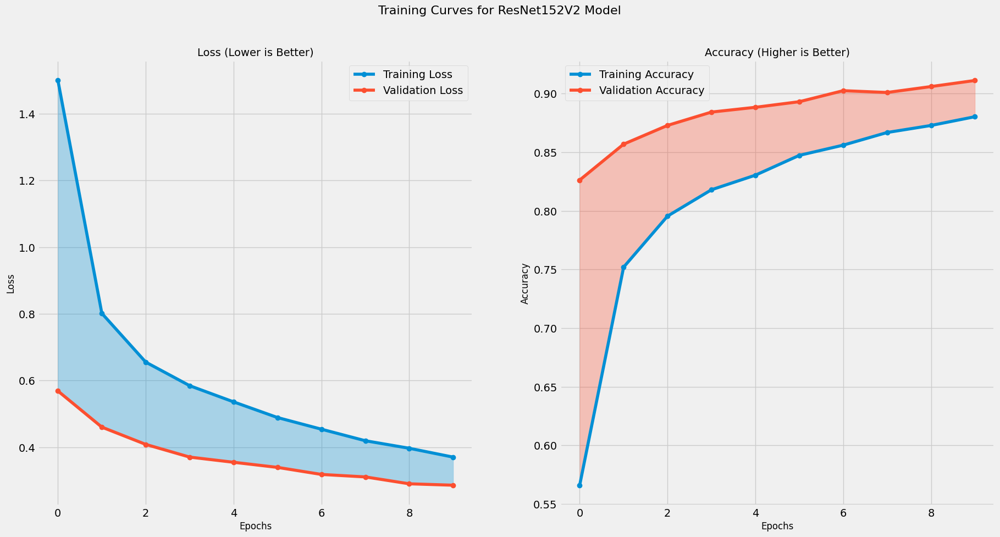

In [46]:

plot_training_curves(history, 'ResNet152V2 Model')


# 14. Training History Visualization

In [47]:
import matplotlib.pyplot as plt
import numpy as np

def plot_finetuning_performance(history, model_name="Fine-tuned Model"):
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']

    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]

    epochs = [i + 1 for i in range(len(tr_acc))]
    loss_label = f'Best Epoch = {index_loss + 1}'
    acc_label = f'Best Epoch = {index_acc + 1}'

    plt.figure(figsize=(20, 8))
    plt.style.use('fivethirtyeight')

    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, tr_loss, 'r', label='Training Loss')
    plt.plot(epochs, val_loss, 'g', label='Validation Loss')
    plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
    plt.title(f'{model_name} - Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, tr_acc, 'r', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'g', label='Validation Accuracy')
    plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
    plt.title(f'{model_name} - Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


# 15. Training and Validation Curve Visualization for ResNet152V2 Model After Fine-Tuning

In [48]:
import matplotlib.pyplot as plt
import numpy as np

def plot_finetuning_curves(history_finetune, model_name):
    loss = np.array(history_finetune.history['loss'])
    val_loss = np.array(history_finetune.history['val_loss'])
    accuracy = np.array(history_finetune.history['accuracy'])
    val_accuracy = np.array(history_finetune.history['val_accuracy'])
    epochs = range(len(loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f'Fine-Tuning Curves for {model_name}', fontsize=16)

    ax1.plot(epochs, loss, label='Training Loss', marker='o', color='blue')
    ax1.plot(epochs, val_loss, label='Validation Loss', marker='o', color='orange')
    ax1.set_title('Loss During Fine-Tuning', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.legend()
    ax1.grid(True)

    ax2.plot(epochs, accuracy, label='Training Accuracy', marker='o', color='green')
    ax2.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o', color='red')
    ax2.set_title('Accuracy During Fine-Tuning', fontsize=14)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()


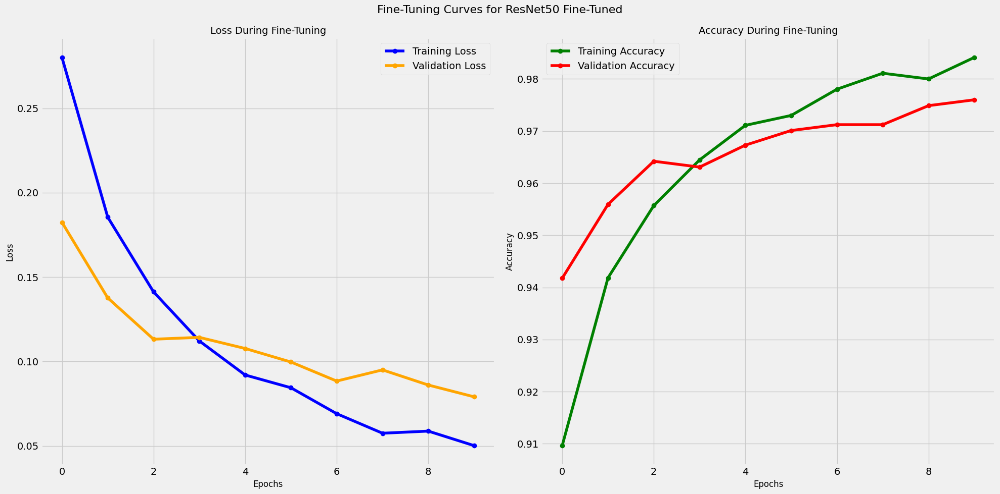

In [49]:
plot_finetuning_curves(history_finetune, "ResNet50 Fine-Tuned")

# 16. Visualization ROC and AUC Curves (Multiclass)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 284ms/step


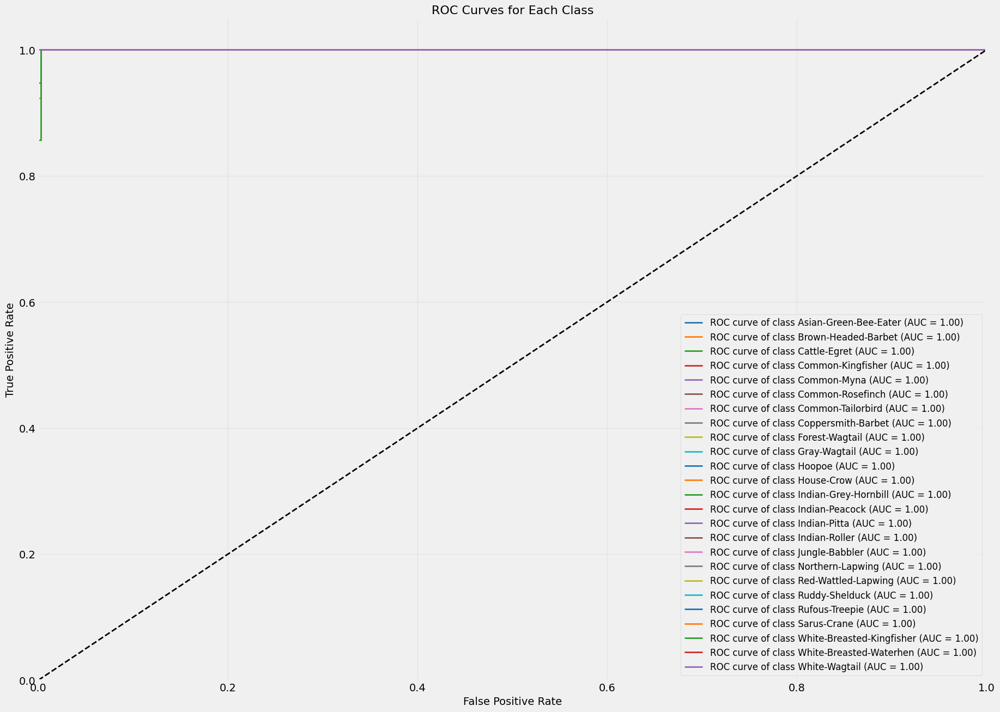

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle


class_names = list(test_images.class_indices.keys())
n_classes = len(class_names)


y_true = test_images.classes
y_score = model.predict(test_images)
y_test = label_binarize(y_true, classes=range(n_classes))  


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


plt.figure(figsize=(20, 15))
colors = cycle(plt.cm.tab10.colors)  

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves for Each Class', fontsize=16)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


# 17. Micro & Macro Average ROC Curve

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import RocCurveDisplay
from numpy import interp
from itertools import cycle


class_names = list(test_images.class_indices.keys())
n_classes = len(class_names)


y_true = test_images.classes
y_score = model.predict(test_images)


y_test = label_binarize(y_true, classes=range(n_classes))


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))


mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 295ms/step


# 18. ROC Curve: Micro, Macro, Per Class

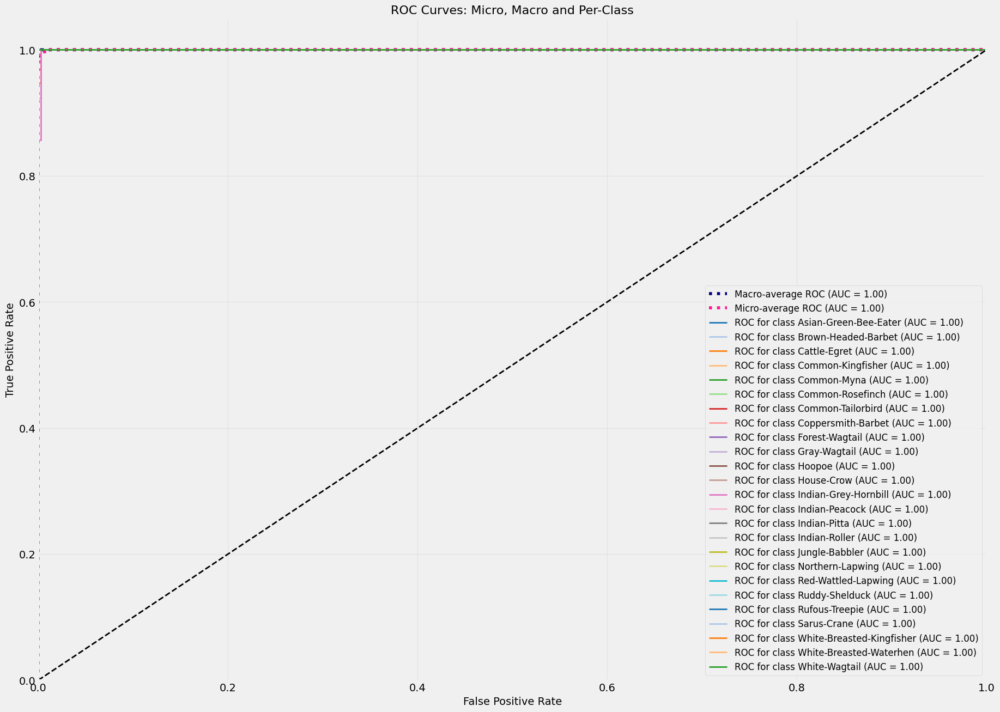

In [52]:

plt.figure(figsize=(20, 15))


plt.plot(fpr["macro"], tpr["macro"],
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})',
         color='navy', linestyle=':', linewidth=4)


plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)


colors = cycle(plt.cm.tab20.colors)
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC for class {class_names[i]} (AUC = {roc_auc[i]:.2f})')


plt.plot([0, 1], [0, 1], 'k--', lw=2)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves: Micro, Macro and Per-Class', fontsize=16)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


**Improved results may be achived through ensembling techniques (such as blending, stacking or voting)**